In [2]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [3]:
import scanpy as sc 
import sys 
import umap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
import glob

sys.path.append('../../src')

In [4]:
from spaceoracle.prophets import Prophet
from spaceoracle.plotting.cartography import xy_from_adata
from spaceoracle.plotting.cartography import Cartography

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [5]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/slideseq_mouse_lymphnode.h5ad')
adata

AnnData object with n_obs × n_vars = 24617 × 3604
    obs: 'cell_type', 'cell_type_int', 'x', 'y', 'banksy_spatial', 'banksy_nonspatial'
    uns: 'cell_thresholds', 'received_ligands', 'received_ligands_tfl'
    obsm: 'X_spatial', 'banksy_nonspatial_umap', 'banksy_spatial_umap', 'spatial', 'spatial_unscaled', 'tangram_ct_pred'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [6]:
adata = adata[~adata.obs.cell_type.str.contains('DC')]

In [7]:
adata.obs.cell_type.cat.categories

Index(['B', 'B | CD8+ T', 'B | Resting T', 'B | Tfh', 'B | Treg', 'CD8+ T',
       'CD8+ T | Resting T', 'CD8+ T | Tfh', 'CD8+ T | Treg', 'Resting T',
       'Resting T | CD8+ T', 'Resting T | Tfh', 'Resting T | Th2',
       'Resting T | Treg', 'Tfh', 'Treg'],
      dtype='object')

In [8]:
wt_count = adata.to_df(layer='imputed_count').copy()
obs = adata.obs.copy()

In [9]:
from spaceoracle.beta import BetaFrame
import warnings
warnings.filterwarnings('ignore')

In [10]:
(dfko - wt_count).join(obs.cell_type).groupby(
    'cell_type'
).mean().abs().mean(axis=1).sort_values(
    ascending=True
)

NameError: name 'dfko' is not defined

In [144]:
adata.obs.cell_type.value_counts(), len(adata.obs.cell_type.unique())

(cell_type
 B                     12312
 Resting T              3767
 CD8+ T                 2073
 B | Resting T           874
 Resting T | Tfh         656
 Resting T | CD8+ T      483
 B | CD8+ T              465
 Resting T | Treg        455
 B | Tfh                 450
 CD8+ T | Resting T      388
 Tfh                     337
 B | Treg                275
 Treg                    272
 CD8+ T | Tfh            183
 CD8+ T | Treg           170
 Resting T | Th2         141
 Name: count, dtype: int64,
 16)

In [152]:
adata.obsm['X_umap'] = adata.obsm['banksy_spatial_umap']

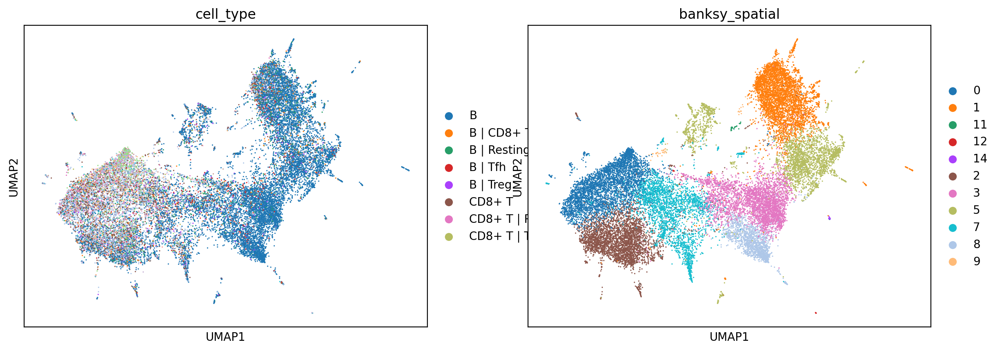

In [153]:
sc.pl.umap(adata, color=['cell_type', 'banksy_spatial'])

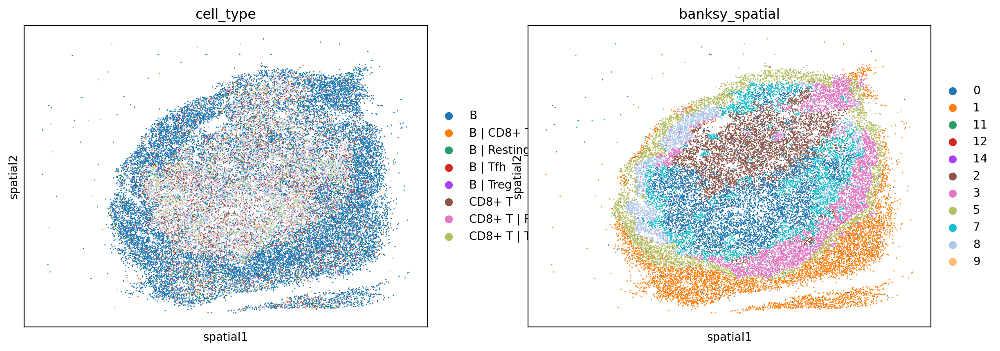

In [154]:
sc.pl.embedding(adata, color=['cell_type', 'banksy_spatial'], basis='spatial')

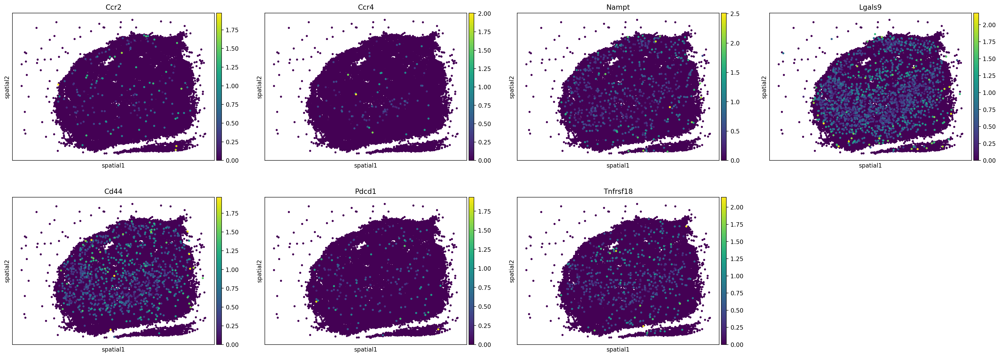

In [118]:
sc.pl.embedding(adata, color=['Ccr2', 'Ccr4', 'Nampt','Lgals9', 'Cd44', 'Pdcd1', 'Tnfrsf18'], 
        basis='spatial', layer='normalized_count', s=50)

In [8]:
adata = adata.copy()
adata.obs['x'] = adata.obsm['spatial'][:, 0]
adata.obs['y'] = adata.obsm['spatial'][:, 1]

In [14]:
adata_1 = adata[adata.obs.cell_type.str.contains(' | ')]
adata_1.obs.cell_type = adata_1.obs.cell_type.replace({
    'Resting T': 'Resting T',
    'CD8+ T': 'CD8+ T',
    'B | Resting T': 'B',
    'Resting T | Tfh': 'Resting T',
    'Resting T | CD8+ T': 'Resting T',
    'B | CD8+ T': 'B',
    'Resting T | Treg': 'Resting T',
    'B | Tfh': 'B',
    'CD8+ T | Resting T': 'CD8+ T',
    'B | Treg': 'B',
    'CD8+ T | Tfh': 'CD8+ T',
    'CD8+ T | Treg': 'CD8+ T',
    'Resting T | Th2': 'Resting T',
})

In [15]:
adata_2 = adata[adata.obs.cell_type.str.contains(' | ')]
adata_2.obs.cell_type = adata_2.obs.cell_type.replace({
    'Resting T': 'Resting T',
    'CD8+ T': 'CD8+ T',
    'B | Resting T': 'Resting T',
    'Resting T | Tfh': 'Tfh',
    'Resting T | CD8+ T': 'CD8+ T',
    'B | CD8+ T': 'CD8+ T',
    'Resting T | Treg': 'Treg',
    'B | Tfh': 'Tfh',
    'CD8+ T | Resting T': 'Resting T',
    'B | Treg': 'Treg',
    'CD8+ T | Tfh': 'Tfh',
    'CD8+ T | Treg': 'Treg',
    'Resting T | Th2': 'Th2',
})

In [16]:
import anndata as ad

In [17]:
merge_df = pd.concat([adata_1.obs, adata_2.obs, adata[~adata.obs.cell_type.str.contains(' | ')].obs])
merge_df

,cell_type,cell_type_int,x,y,banksy_spatial,banksy_nonspatial
AAAAAAAAAAAATC,Resting T,12,-3191.440751,3648.762827,2,1
AAAAAAATTTAGGG,B,3,-2207.315048,4138.764785,2,0
AAAAAACGGTAGAT,B,3,-4172.818596,2577.294496,5,5
AAAAAACGTGCGCC,CD8+ T,6,-2983.094235,2641.084056,2,1
AAAAAATCCGGCGA,Resting T,12,-2897.419949,1938.515657,0,0
...,...,...,...,...,...,...
TTTTTTATAATACC,B,0,-3906.374511,2213.007040,8,3
TTTTTTATTGCGTA,B,0,-1285.604977,4336.218007,3,3
TTTTTTCCCCATGC,B,0,-1763.928538,3714.220729,2,1
TTTTTTGTACGATT,B,0,-2013.885475,2882.993694,7,3


In [18]:
adata_m = ad.AnnData(
    # adata.to_df(layer='imputed_count').loc[merge_df.index],
    adata.to_df(layer='normalized_count').loc[merge_df.index],
    obs=merge_df,
)
adata_m.obsm['spatial'] = adata_m.obs[['x', 'y']].values

In [23]:
adata_m.obs.cell_type.value_counts()

cell_type
B            14376
Resting T    10531
CD8+ T        5835
Tfh           1626
Treg          1172
Th2            141
Name: count, dtype: int64

In [24]:
color_dict = {
    'Resting T': '#5ea2da',
    'B': '#0649f3',
    'CD8+ T': '#9a6834',
    'Tfh': '#5a6ed9',
    'Treg': '#5db852',
    'Th2': '#b0398d',
    'B | Resting T': '#4fb597',
    'CD8+ T | Resting T': '#93538b',
    'B | CD8+ T': '#5d6cb1',
    'B | Treg': '#5a7c38',
    'Resting T | Tfh': '#de85b6',
    'DC': '#b48cdd',
    'Resting T | Treg': '#d3a048',
    'Resting T | DC': '#a5b146',
    'B | Tfh': '#cd4263',
    'CD8+ T | DC': '#de763f',
    'Resting T | Th2': '#b0398d',
    'Tfh': '#5a6ed9',
    'Treg': '#5db852',
    'B | DC': '#cb4435',
    'CD8+ T | Tfh': '#e54996',
    'Resting T | CD8+ T': '#da6dd8',
    'CD8+ T | Treg': '#9152c5'
}

In [28]:
adata_m.layers['imputed_count'] = adata_m.X

In [42]:
chart = Cartography(adata_m, color_dict)
chart.adata.obs.cell_type = chart.adata.obs.cell_type.cat.remove_unused_categories()

In [53]:
data = (pd.read_parquet(
    f'/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/Pax5_4n_0x.parquet').loc[
        chart.adata.obs_names
    ]-chart.adata.to_df(layer='imputed_count')
    ).join(chart.adata.obs.cell_type).groupby(
        'cell_type'
    ).mean().abs().mean(axis=1)

In [54]:
pd.read_parquet(
    '/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/Pax5_4n_0x.parquet')

,Adal,Adam11,Adam32,Adam9,Adamts1,Adamts12,Adamts15,Adamts9,Adamtsl1,Adat1,...,Zkscan6,Zkscan7,Zmym2,Znhit1,Znrd1,Znrd1as,Zswim4,Zswim5,Zswim6,Zswim7
Pax5_4n_0x,,,,,,,,,,,,,,,,,,,,,
AAAAAAAAAAAATC,0.000862,0.000641,2.966523e-05,0.002771,0.000547,0.000003,0.000010,0.000000,1.379830e-04,0.000433,...,0.001926,0.000732,0.007972,0.008611,0.026680,0.002200,0.000399,0.000083,0.025211,0.000447
AAAAAAAACCAACA,0.003834,0.000573,5.182868e-05,0.005342,0.002678,0.000029,0.000144,0.000582,0.000000e+00,0.001125,...,0.003363,0.001323,0.007403,0.007085,0.028371,0.002748,0.000707,0.000034,0.005920,0.000797
AAAAAAAGCCAACA,0.009324,0.000549,6.195422e-07,0.001872,0.000362,0.000013,0.000026,0.000127,1.296585e-05,0.000389,...,0.007075,0.000716,0.004319,0.013876,0.027454,0.000869,0.001016,0.000094,0.023550,0.000456
AAAAAAATTTAGGG,0.000521,0.001453,1.165078e-05,0.006342,0.000243,0.001287,0.000039,0.000641,0.000000e+00,0.001424,...,0.002499,0.000537,0.005722,0.005617,0.022191,0.002300,0.000393,0.000061,0.011995,0.000335
AAAAAACGGTAGAT,0.003627,0.001004,5.554652e-05,0.004097,0.001192,0.000175,0.000201,0.001120,7.090059e-04,0.001877,...,0.001967,0.000940,0.012398,0.014139,0.025221,0.003352,0.001016,0.000043,0.006358,0.009660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTGTTTTCTA,0.002307,0.001354,2.369164e-05,0.004467,0.000448,0.000131,0.000088,0.000754,2.001629e-07,0.002609,...,0.004813,0.003328,0.011220,0.011765,0.036914,0.002173,0.000799,0.000056,0.010034,0.001038
TTTTTTTATGGTAC,0.005245,0.002113,9.902346e-05,0.004972,0.000227,0.001459,0.000024,0.002386,0.000000e+00,0.000922,...,0.003436,0.000443,0.008041,0.005853,0.031422,0.001008,0.007741,0.000138,0.016274,0.000885
TTTTTTTGTCGCCT,0.001208,0.003773,1.851936e-05,0.002992,0.000242,0.000024,0.000483,0.000073,0.000000e+00,0.000773,...,0.004198,0.001573,0.010172,0.013584,0.023417,0.001219,0.000715,0.000044,0.010154,0.000659


In [56]:
pd.read_parquet(
    '/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/C3_4n_0x.parquet')

,Adal,Adam11,Adam32,Adam9,Adamts1,Adamts12,Adamts15,Adamts9,Adamtsl1,Adat1,...,Zkscan6,Zkscan7,Zmym2,Znhit1,Znrd1,Znrd1as,Zswim4,Zswim5,Zswim6,Zswim7
C3_4n_0x,,,,,,,,,,,,,,,,,,,,,
AAAAAAAAAAAATC,0.000862,0.000641,2.966523e-05,0.002771,0.000547,0.000003,0.000010,0.000254,1.379830e-04,0.000433,...,0.001926,0.000732,0.007972,0.007319,0.028854,0.002200,0.000399,0.000083,0.027103,0.000447
AAAAAAAACCAACA,0.003834,0.000573,5.182868e-05,0.005342,0.002678,0.000029,0.000144,0.000580,0.000000e+00,0.001125,...,0.003363,0.001323,0.007403,0.006853,0.028774,0.002748,0.000707,0.000034,0.005920,0.000797
AAAAAAAGCCAACA,0.009324,0.000549,6.195422e-07,0.001872,0.000362,0.000013,0.000026,0.000110,1.296585e-05,0.000389,...,0.007075,0.000716,0.004319,0.013035,0.029082,0.000869,0.001016,0.000094,0.023550,0.000456
AAAAAAATTTAGGG,0.000521,0.001453,1.165078e-05,0.006342,0.000243,0.001287,0.000039,0.000612,0.000000e+00,0.001424,...,0.003063,0.000537,0.005722,0.004717,0.022684,0.002300,0.000393,0.000061,0.012422,0.000335
AAAAAACGGTAGAT,0.003627,0.001004,5.554652e-05,0.004097,0.001192,0.000175,0.000201,0.001129,7.090059e-04,0.001877,...,0.002759,0.000940,0.012398,0.013048,0.027726,0.003352,0.001016,0.000043,0.007394,0.009660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTTTTGTTTTCTA,0.002307,0.001354,2.369164e-05,0.004467,0.000448,0.000131,0.000088,0.000812,2.001629e-07,0.002609,...,0.004813,0.003328,0.011220,0.010961,0.038611,0.002173,0.000799,0.000056,0.010392,0.001038
TTTTTTTATGGTAC,0.005245,0.002113,9.902346e-05,0.004972,0.000227,0.001459,0.000024,0.002392,0.000000e+00,0.000922,...,0.003492,0.000443,0.008041,0.004964,0.032767,0.001008,0.007741,0.000138,0.016769,0.000885
TTTTTTTGTCGCCT,0.001208,0.003773,1.851936e-05,0.002992,0.000242,0.000024,0.000483,0.000076,0.000000e+00,0.000773,...,0.004198,0.001573,0.010172,0.013391,0.024200,0.001219,0.000715,0.000044,0.010399,0.000659


In [48]:
data = (data - data.min()) / (data.max() - data.min())

In [52]:
data.sort_values(ascending=False)

cell_type
Th2          0.003738
B            0.002054
Tfh          0.001880
Treg         0.001745
CD8+ T       0.001317
Resting T    0.000992
dtype: float64

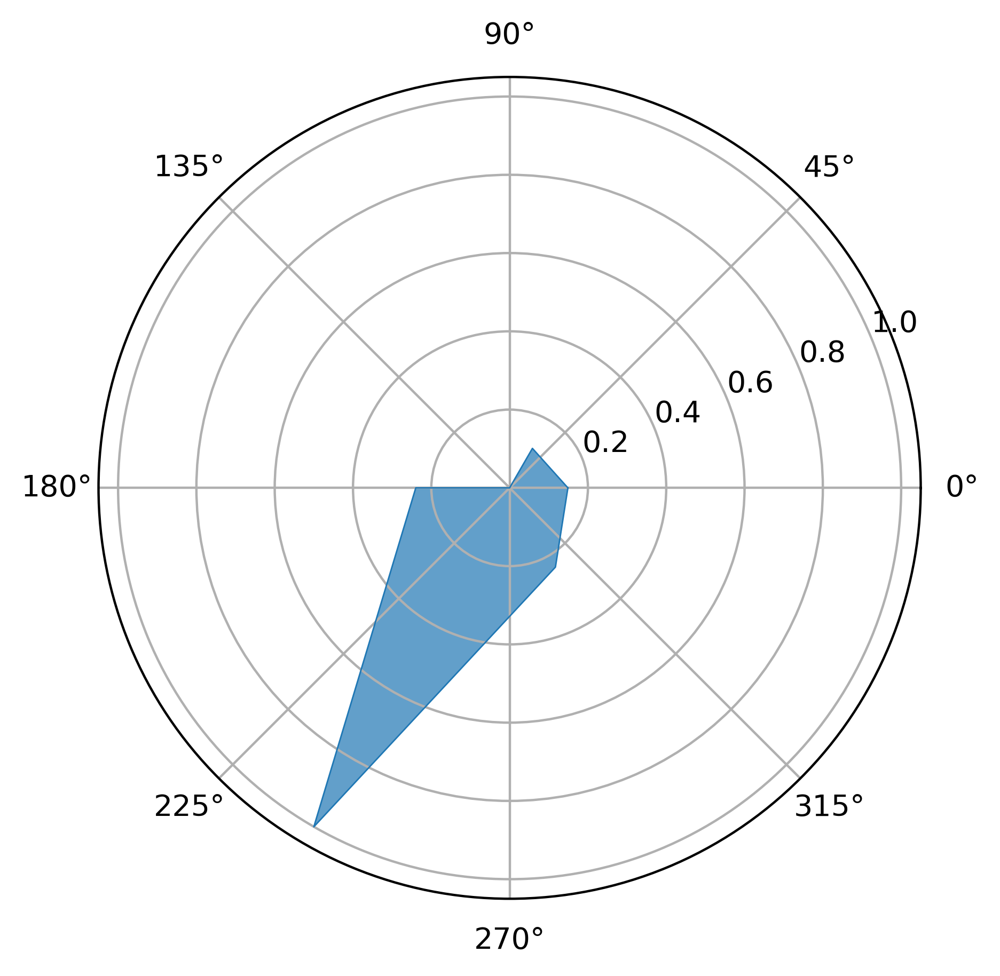

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5), dpi=200, subplot_kw={'projection': 'polar'})

# Prepare data for radar plot
categories = data.index.tolist()
values = data.values.tolist()
values += values[:1] # Repeat first value to close the polygon
angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)
angles = np.concatenate((angles, [angles[0]])) # Repeat first angle to close the polygon

# Plot data
ax.plot(angles, values, '-', linewidth=0.5, label=kotarget)
ax.fill(angles, values, alpha=0.7)

KeyboardInterrupt: 

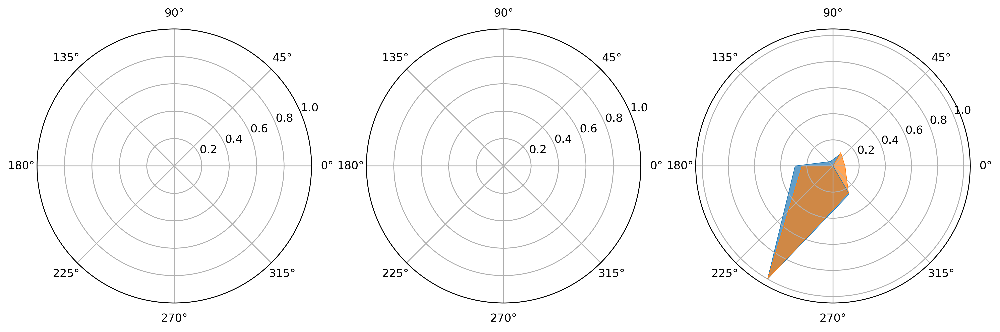

In [47]:
import random
colors = [random.choice(['#%06X' % random.randint(0, 0xFFFFFF) for _ in range(6)]) for _ in range(20)]

ligands = ['Il2', 'Il16',  'Il6st', 'Cxcl13', 'Ccl12', 'Ccl20']
receptors = ['Il2ra', 'Cxcr4', 'Ccr4', 'Il4ra', 'Ccr4', 'Cxcr5']
tf = ['Gata3', 'Prdm1', 'Pax5', 'Stat4', 'Foxp3', 'Bcl6']

fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=200, subplot_kw={'projection': 'polar'})

# Helper function to plot radar chart
def plot_radar(kotargets, ax, title):
    for kotarget in kotargets:
        data = (pd.read_parquet(
            f'/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/{kotarget}_4n_0x.parquet').loc[
                chart.adata.obs_names
            ]-chart.adata.to_df(layer='imputed_count')
            ).join(chart.adata.obs.cell_type).groupby(
                'cell_type'
            ).mean().abs().mean(axis=1)
        
        # Normalize values between 0 and 1
        data = (data - data.min()) / (data.max() - data.min())

        # Prepare data for radar plot
        categories = data.index.tolist()
        values = data.values.tolist()
        values += values[:1] # Repeat first value to close the polygon
        angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)
        angles = np.concatenate((angles, [angles[0]])) # Repeat first angle to close the polygon

        # Plot data
        ax.plot(angles, values, '-', linewidth=0.5, label=kotarget)
        ax.fill(angles, values, alpha=0.7)
    
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, size=8)
    ax.tick_params(pad=20)
    ax.set_yticklabels([])
    ax.grid(True, alpha=0.35)
    ax.spines['polar'].set_visible(False)
    ax.set_title(title)
    legend = ax.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=2, markerscale=1)
    for text, line in zip(legend.get_texts(), legend.get_lines()):
        text.set_color(line.get_color())

# plot_radar(ligands, axs[0], 'Ligand KO Impacts')
# plot_radar(receptors, axs[1], 'Receptor KO Impacts')
plot_radar(tf, axs[2], 'Transcription Factor KO Impacts')
plt.tight_layout()
plt.show()

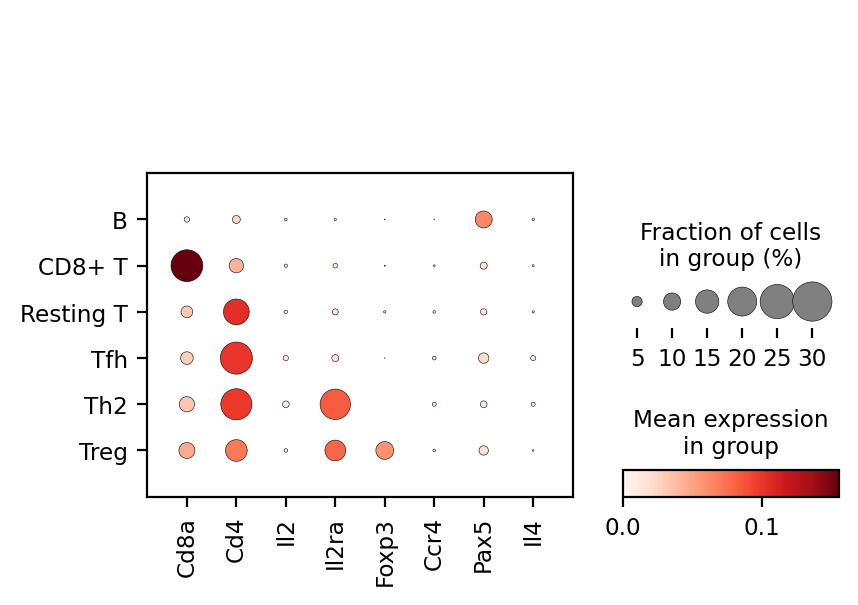

In [65]:
sc.pl.dotplot(
    adata_m, 
    var_names=['Cd8a', 'Cd4', 'Il2', 'Il2ra', 'Foxp3', 'Ccr4', 'Pax5', 'Il4'], 
    groupby='cell_type'
)

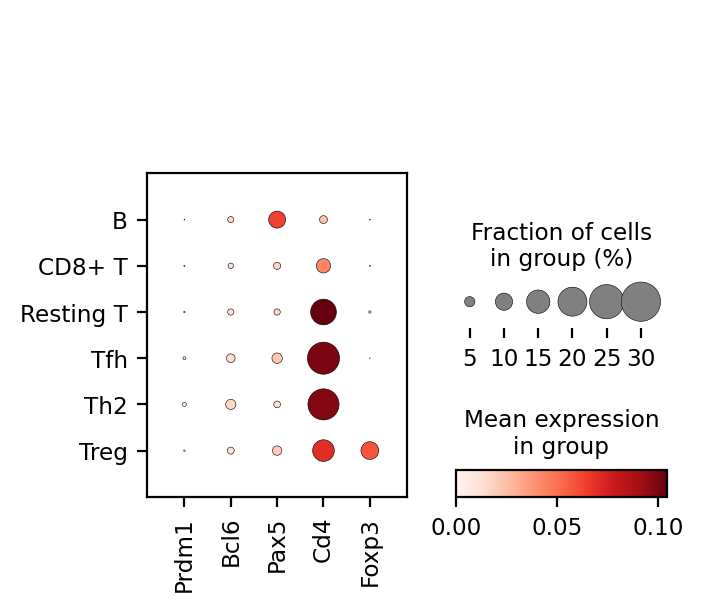

In [78]:
sc.pl.dotplot(
    adata_m, 
    var_names=['Prdm1', 'Bcl6', 'Pax5', 'Cd4', 'Foxp3'], 
    groupby='cell_type'
)

In [56]:
import commot as ct
from spaceoracle.tools.network import expand_paired_interactions

df_ligrec = ct.pp.ligand_receptor_database(
    database='CellChat', 
    species='mouse', 
    signaling_type=None
)

df_ligrec.columns = ['ligand', 'receptor', 'pathway', 'signaling']  
    
lr = expand_paired_interactions(df_ligrec)
lr = lr[lr.ligand.isin(adata.var_names) &\
    (lr.receptor.isin(adata.var_names))] 


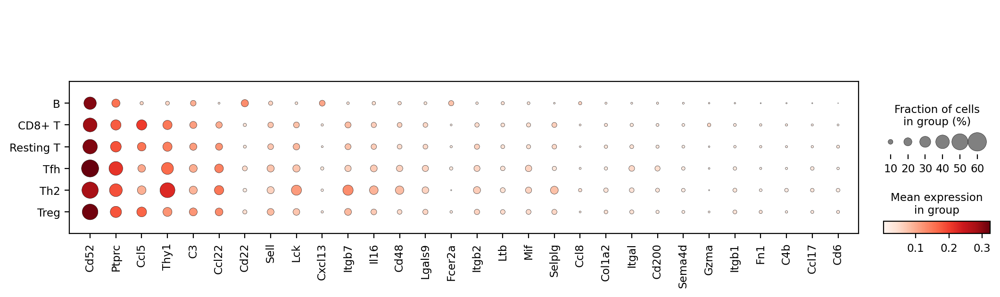

In [117]:
sc.pl.dotplot(
    adata_m, 
    var_names=adata_m.to_df()[lr.ligand.unique()].mean(axis=0).sort_values(ascending=False).head(30).index.tolist(), 
    groupby='cell_type'
)

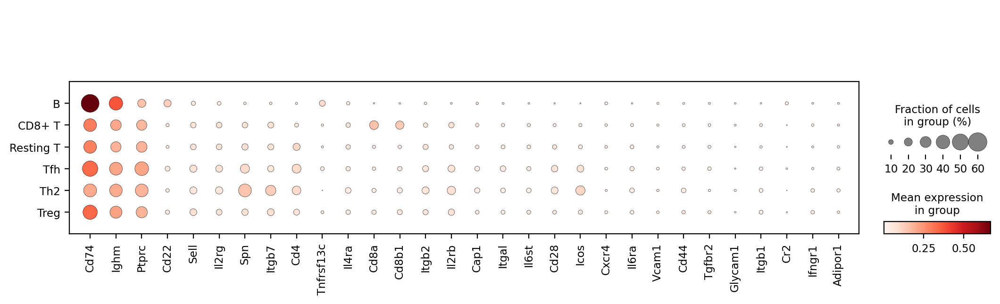

In [116]:
sc.pl.dotplot(
    adata_m, 
    var_names=adata_m.to_df()[lr.receptor.unique()].mean(axis=0).sort_values(ascending=False).head(30).index.tolist(), 
    groupby='cell_type'
)

In [71]:
ref = sc.read_h5ad('/Users/koush/Downloads/zhongli_ref_202401203_mannually_woDoublet.h5ad')
sc.pp.normalize_total(ref)
sc.pp.log1p(ref)

In [72]:
ref.X.max()

3.971387431217006

In [73]:
ref.obs.cell_type.value_counts()

cell_type
B            8158
Resting T    3493
CD8+ T       2631
DC            520
Treg          416
Tfh           376
Th2           188
NK             86
gd T           80
Name: count, dtype: int64

In [74]:
ref.layers['normalized_count'] = ref.X.copy()

In [104]:
[i for i in ref.var_names if 'Tnfrsf18' in i]

['Tnfrsf18']

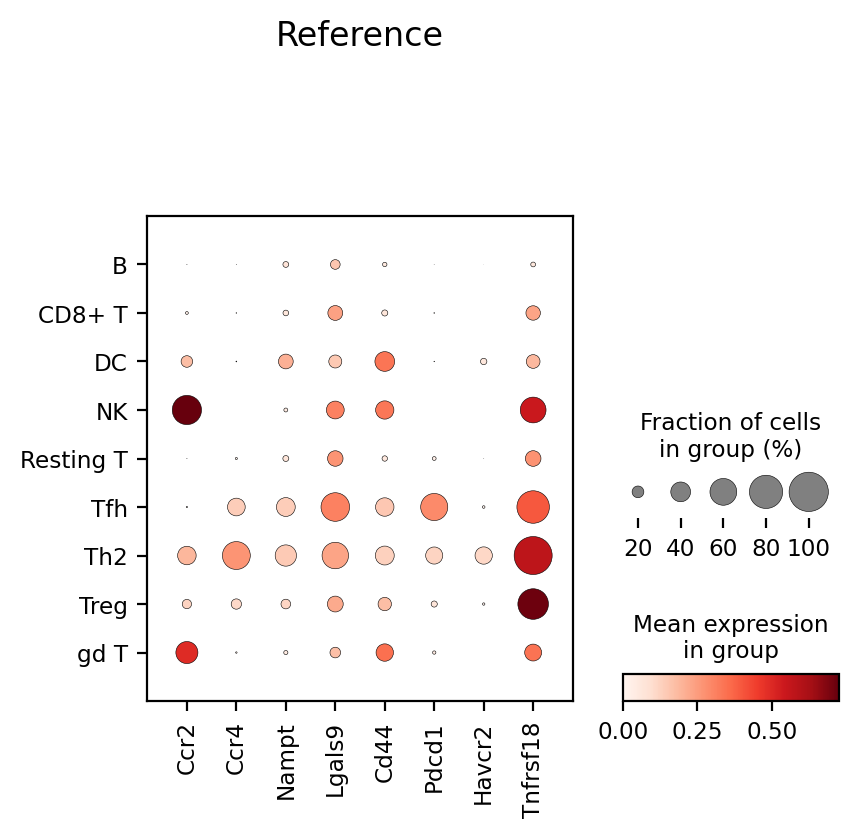

In [111]:
sc.pl.dotplot(
    ref, 
    var_names=['Ccr2', 'Ccr4', 'Nampt','Lgals9', 'Cd44', 'Pdcd1', 'Havcr2', 'Tnfrsf18'],
    groupby='cell_type',
    layer='normalized_count',
    title='Reference',
)

In [106]:
df_ligrec.query('receptor == "Tnfrsf18"')

,ligand,receptor,pathway,signaling
822,Tnfsf18,Tnfrsf18,GITRL,Secreted Signaling


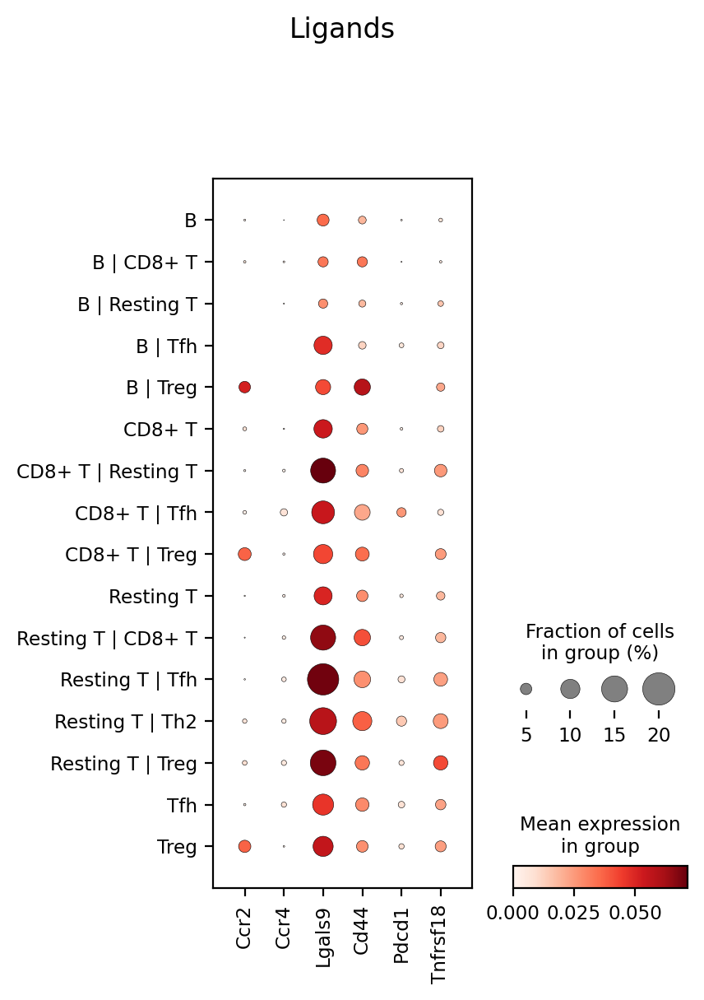

In [107]:
sc.pl.dotplot(
    adata, 
    var_names=['Ccr2', 'Ccr4', 'Lgals9', 'Cd44', 'Pdcd1', 'Tnfrsf18'],
    groupby='cell_type',
    layer='normalized_count',
    title='Ligands'
)

In [93]:
df_ligrec.query('receptor == "Pdcd1"')

,ligand,receptor,pathway,signaling
1966,Cd274,Pdcd1,PD-L1,Cell-Cell Contact
1967,Pdcd1lg2,Pdcd1,PDL2,Cell-Cell Contact


In [85]:
'Smad3' in adata.var_names

False

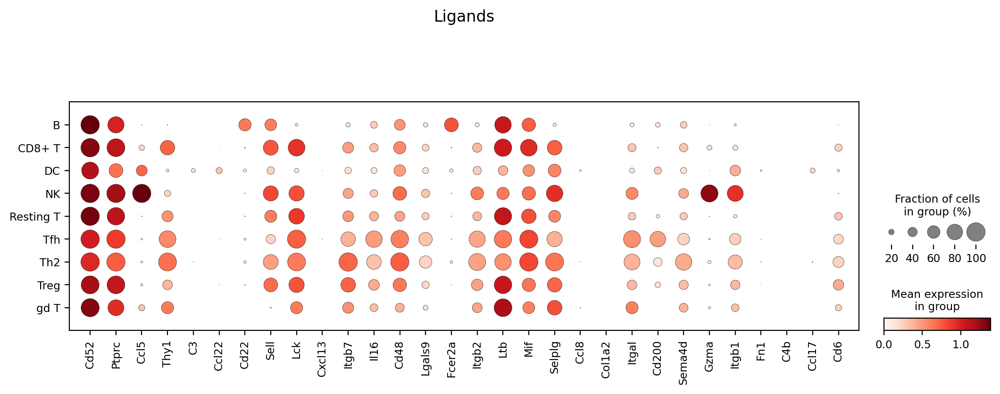

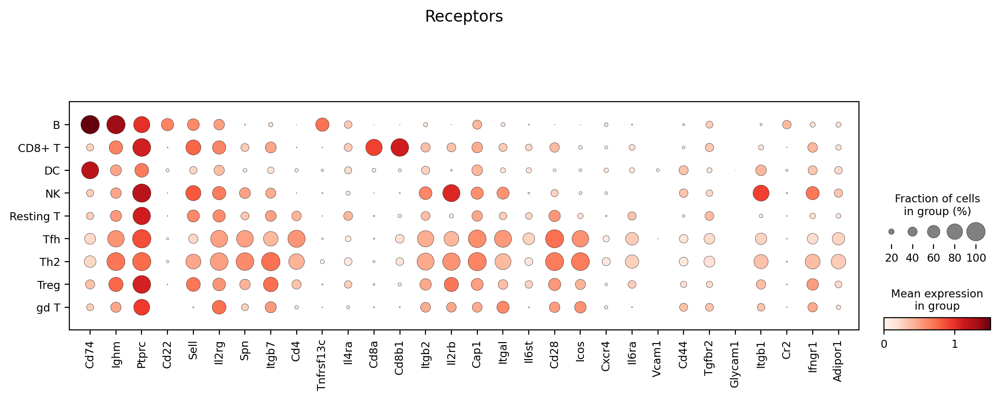

In [119]:
sc.pl.dotplot(
    ref, 
    var_names=adata_m.to_df()[lr.ligand.unique()].mean(axis=0).sort_values(ascending=False).head(30).index.tolist(), 
    groupby='cell_type',
    layer='normalized_count',
    title='Ligands'
)

sc.pl.dotplot(
    ref, 
    var_names=adata_m.to_df()[lr.receptor.unique()].mean(axis=0).sort_values(ascending=False).head(30).index.tolist(), 
    groupby='cell_type',
    layer='normalized_count',
    title='Receptors'
)

In [114]:
lr.query('ligand == "Thy1"')

,ligand,receptor,pathway,signaling
2010,Thy1,Itgam,THY1,Cell-Cell Contact
2010,Thy1,Itgb2,THY1,Cell-Cell Contact
2011,Thy1,Itgax,THY1,Cell-Cell Contact
2011,Thy1,Itgb2,THY1,Cell-Cell Contact
2012,Thy1,Itgav,THY1,Cell-Cell Contact
2012,Thy1,Itgb3,THY1,Cell-Cell Contact


In [438]:
adata_m.obs.cell_type.value_counts()

cell_type
B            14376
Resting T    10531
CD8+ T        5835
Tfh           1626
Treg          1172
Th2            141
Name: count, dtype: int64

In [7]:
# for i in adata.obs.cell_type.cat.categories:
#     print(i.split(' | '))

In [155]:
xy = xy_from_adata(adata)

In [156]:
color_dict = {
    'Resting T': '#5ea2da',
    'B': '#0649f3',
    'B | Resting T': '#4fb597',
    'CD8+ T': '#9a6834',
    'CD8+ T | Resting T': '#93538b',
    'B | CD8+ T': '#5d6cb1',
    'B | Treg': '#5a7c38',
    'Resting T | Tfh': '#de85b6',
    'DC': '#b48cdd',
    'Resting T | Treg': '#d3a048',
    'Resting T | DC': '#a5b146',
    'B | Tfh': '#cd4263',
    'CD8+ T | DC': '#de763f',
    'Resting T | Th2': '#b0398d',
    'Tfh': '#5a6ed9',
    'Treg': '#5db852',
    'B | DC': '#cb4435',
    'CD8+ T | Tfh': '#e54996',
    'Resting T | CD8+ T': '#da6dd8',
    'CD8+ T | Treg': '#9152c5'
}

In [170]:
chart = Cartography(adata[adata.obs.cell_type != 'B'], color_dict)
chart.adata.obs.cell_type = chart.adata.obs.cell_type.cat.remove_unused_categories()


/opt/homebrew/Caskroom/miniforge/base/envs/SpaceOracle/lib/python3.9/site-packages/pandas/core/generic.py:6329: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


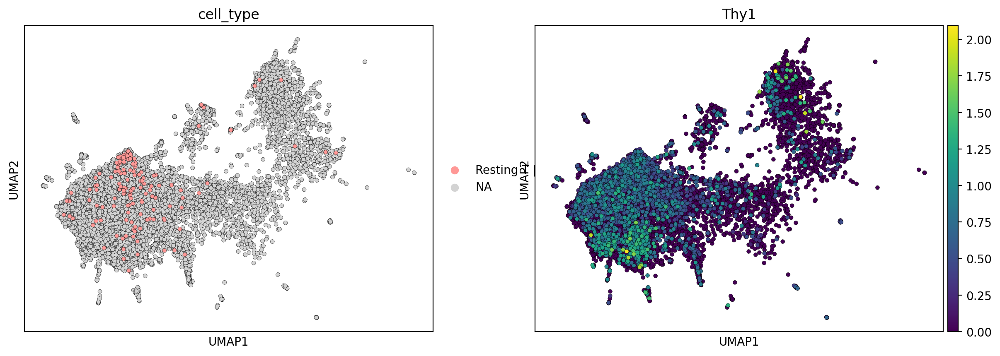

In [195]:
sc.pl.umap(chart.adata, color=['cell_type', 'Thy1'], s=50, edgecolor='black', linewidth=0.2, 
    groups=['Resting T | Th2'])

In [196]:
dfko = pd.read_parquet('/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/Thy1_4n_0x.parquet')

In [197]:
(dfko - adata.to_df(layer='imputed_count')).mean().sort_values(ascending=False, key=abs).head(20)

Thy1     -9.299329e-02
Lyz2      5.985831e-15
Malat1    6.570422e-16
Ccl22    -2.724089e-16
Eef1b2   -2.258057e-16
Cxcl13   -1.685200e-16
Cd74     -1.651731e-16
Cst3     -1.568275e-16
Ccl8      1.258406e-16
Cd52     -3.703215e-17
Fth1     -3.267751e-17
Tmsb4x    1.547337e-17
Ccl5      1.349661e-17
Fabp4    -2.365227e-18
Pnn       0.000000e+00
Pnkp      0.000000e+00
Adal      0.000000e+00
Pmp22     0.000000e+00
Pnisr     0.000000e+00
Pmvk      0.000000e+00
dtype: float64

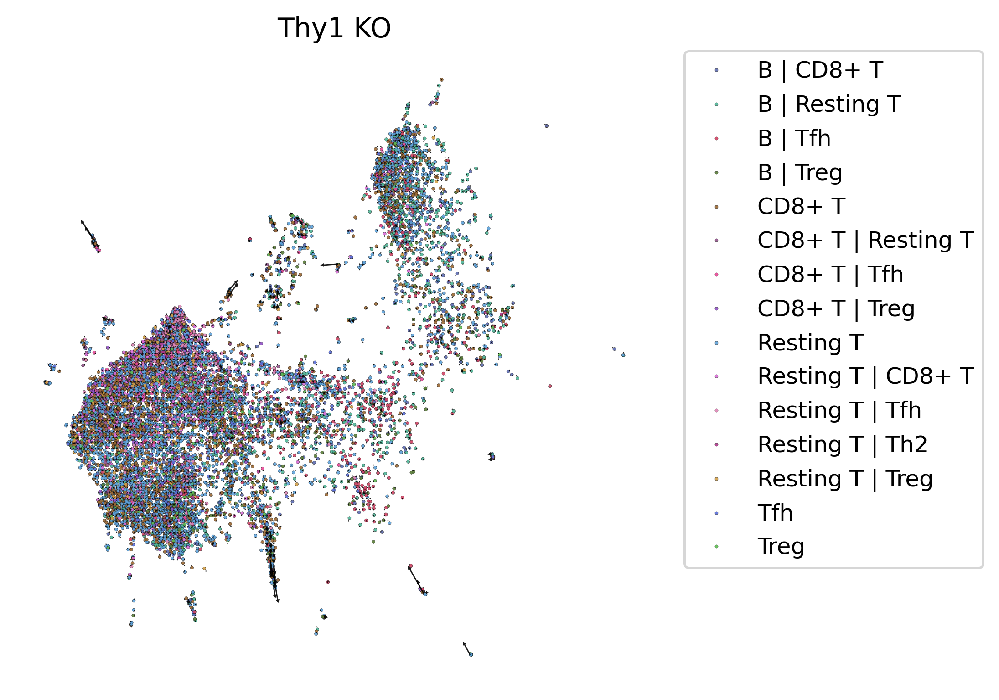

In [198]:
kotarget = 'Thy1'
ax = chart.plot_umap_quiver(
    perturb_target=kotarget,
    grid_scale=4,
    vector_scale=0.5,
    figsize=(5, 5), 
    hue='cell_type',
    alpha=0.9,
    scatter_size=2,
    betadata_path='/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode',
    legend_on_loc=False,
    rescale=1e12
)
plt.title(f'{kotarget} KO')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

In [124]:
import enlighten

In [125]:
# manager = enlighten.get_manager()
# paths = list(glob.glob('/Volumes/SSD/genome_screens/slideseq_mouse_lymphnode/*.parquet'))

# pbar = manager.counter(
#     total=len(paths), 
#     auto_refresh=True,
#     color='salmon'
# )

# ko_screen = []
# for kodf in paths:
#     data = (pd.read_parquet(kodf).loc[adata_m.obs_names] - adata.to_df(
#         layer='imputed_count').loc[adata_m.obs_names]).join(
#         adata_m.obs.cell_type
#     ).groupby(
#         'cell_type'
#     ).mean().abs().mean(axis=1).sort_values(
#         ascending=True
#     )
#     data = data.to_frame()
#     data.columns = [kodf.split('/')[-1].split('_')[0]]
#     ko_screen.append(data)
#     pbar.update()

In [467]:
# pd.concat(ko_screen, axis=1).to_csv('ko_screen.csv')

In [469]:
adata

AnnData object with n_obs × n_vars = 23301 × 3604
    obs: 'cell_type', 'cell_type_int', 'x', 'y'
    uns: 'cell_thresholds', 'received_ligands', 'received_ligands_tfl'
    obsm: 'X_spatial', 'spatial', 'spatial_unscaled', 'tangram_ct_pred'
    layers: 'imputed_count', 'normalized_count', 'raw_count'

In [126]:
# import matplotlib.pyplot as plt
# import random

# unique_cell_types = adata_m.obs.cell_type.unique()
# fig, axs = plt.subplots(2, 3, figsize=(20, 15))
# for i, cell_type in enumerate(unique_cell_types):
#     row, col = divmod(i, 3)
#     colors = [random.choice(['#%06X' % random.randint(0, 0xFFFFFF) for _ in range(6)]) for _ in range(20)]
#     axs[row, col].barh(pd.concat(ko_screen, axis=1).loc[cell_type].sort_values(ascending=False).head(20).index, 
#                        pd.concat(ko_screen, axis=1).loc[cell_type].sort_values(ascending=False).head(20).values, 
#                        color=colors, linewidth=1, edgecolor='black')
#     axs[row, col].set_title(cell_type)
#     axs[row, col].invert_yaxis()
#     axs[row, col].ticklabel_format(style='sci', axis='x', scilimits=(0,0))
# plt.tight_layout()
# plt.show()

In [88]:
import commot as ct

df_ligrec = ct.pp.ligand_receptor_database(
        database='CellChat', 
        species='mouse', 
        signaling_type=None
    )
    
df_ligrec.columns = ['ligand', 'receptor', 'pathway', 'signaling']  

In [40]:
df_ligrec[df_ligrec.receptor == 'Ccr4']

,ligand,receptor,pathway,signaling
645,Ccl17,Ccr4,CCL,Secreted Signaling
646,Ccl22,Ccr4,CCL,Secreted Signaling
647,Ccl5,Ccr4,CCL,Secreted Signaling


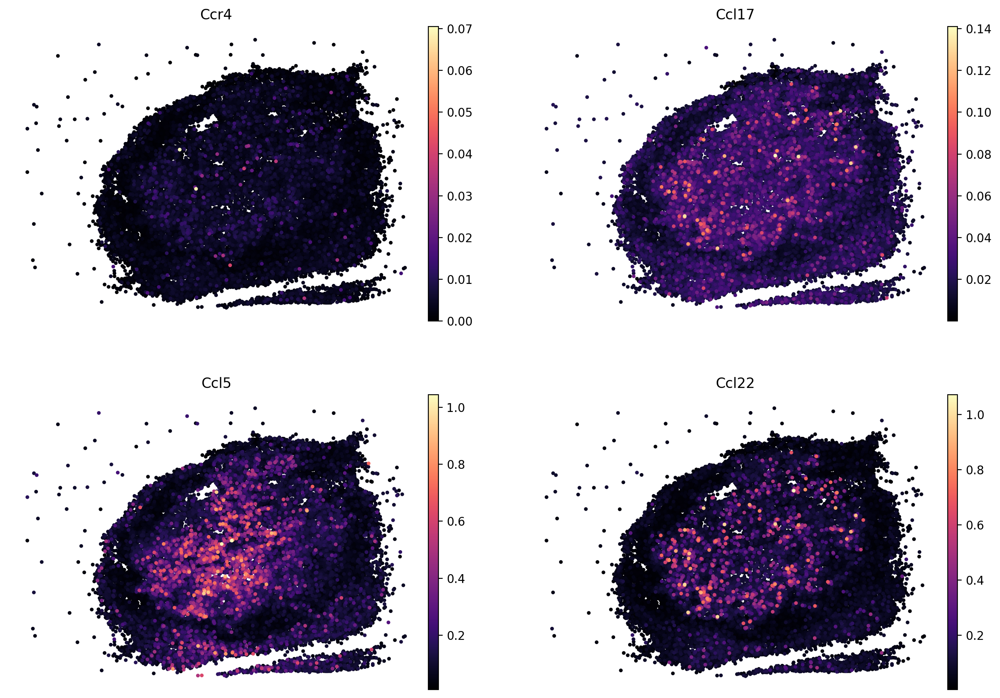

In [83]:
sc.pl.embedding(adata, color=['Ccr4', 'Ccl17', 'Ccl5', 'Ccl22'], add_outline=False, 
    basis='spatial', layer='imputed_count', cmap='magma', frameon=False, size=40, ncols=2)

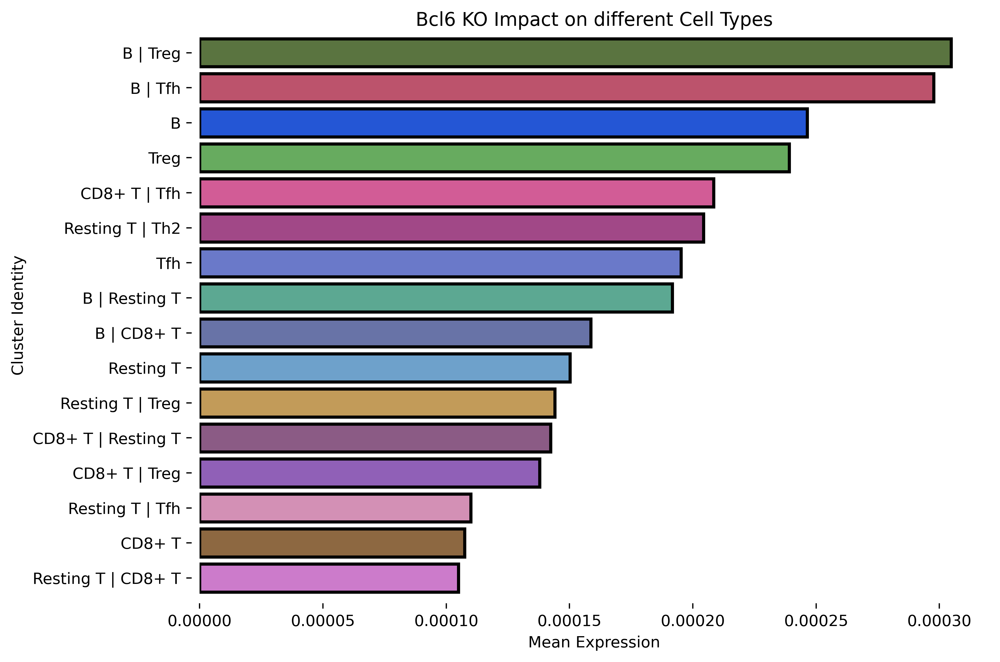

In [118]:
kotarget = 'Bcl6'
data = (pd.read_parquet(
    f'/Volumes/SSD/genome_screens/lymph/{kotarget}_4n_0x.parquet').loc[
        chart.adata.obs_names
    ]-chart.adata.to_df(layer='imputed_count')
    ).join(chart.adata.obs.cell_type).groupby(
        'cell_type'
    ).mean().abs().mean(axis=1).sort_values(
        ascending=True
    )

plt.figure(figsize=(9, 6), dpi=200)
sns.barplot(
    x=data.values,
    y=data.index,
    edgecolor='black',
    palette=color_dict,
    linewidth=2,
    order=data.index[::-1],
)

plt.xlabel('Mean Expression')
plt.ylabel('Cluster Identity')
plt.title(f'{kotarget} KO Impact on different Cell Types')

sns.despine(offset=5)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

In [1]:
# import random
# colors = [random.choice(['#%06X' % random.randint(0, 0xFFFFFF) for _ in range(6)]) for _ in range(20)]

# ligands = ['Il2', 'Il16',  'Il6st', 'Cxcl13', 'Ccl12', 'Ccl20']
# receptors = ['Il2ra', 'Cxcr4', 'Ccr4', 'Il4ra', 'Ccr4', 'Cxcr5']
# tf = ['Gata3', 'Prdm1', 'Pax5', 'Stat4', 'Foxp3', 'Bcl6']

# fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=200, subplot_kw={'projection': 'polar'})

# # Helper function to plot radar chart
# def plot_radar(kotargets, ax, title):
#     for kotarget in kotargets:
#         data = (pd.read_parquet(
#             f'/tmp/lymph/{kotarget}_4n_0x.parquet').loc[
#                 chart.adata.obs_names
#             ]-chart.adata.to_df(layer='imputed_count')
#             ).join(chart.adata.obs.cell_type).groupby(
#                 'cell_type'
#             ).mean().abs().mean(axis=1)
        
#         # Normalize values between 0 and 1
#         data = (data - data.min()) / (data.max() - data.min())

#         # Prepare data for radar plot
#         categories = data.index.tolist()
#         values = data.values.tolist()
#         values += values[:1] # Repeat first value to close the polygon
#         angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)
#         angles = np.concatenate((angles, [angles[0]])) # Repeat first angle to close the polygon

#         # Plot data
#         ax.plot(angles, values, '-', linewidth=0.5, label=kotarget)
#         ax.fill(angles, values, alpha=0.7)
    
#     ax.set_xticks(angles[:-1])
#     ax.set_xticklabels(categories, size=8)
#     ax.tick_params(pad=20)
#     ax.set_yticklabels([])
#     ax.grid(True, alpha=0.35)
#     ax.spines['polar'].set_visible(False)
#     ax.set_title(title)
#     legend = ax.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=2, markerscale=1)
#     for text, line in zip(legend.get_texts(), legend.get_lines()):
#         text.set_color(line.get_color())

# plot_radar(ligands, axs[0], 'Ligand KO Impacts')
# plot_radar(receptors, axs[1], 'Receptor KO Impacts')
# plot_radar(tf, axs[2], 'Transcription Factor KO Impacts')

# plt.tight_layout()
# plt.show()

In [ ]:
kotarget = 'Ccr4'
data = (pd.read_parquet(
    f'/Volumes/SSD/genome_screens/lymph/{kotarget}_4n_0x.parquet').loc[
        chart.adata.obs_names
    ]-chart.adata.to_df(layer='imputed_count')
    ).join(chart.adata.obs.cell_type_2).groupby(
        'cell_type_2'
    ).mean().abs().mean(axis=1).sort_values(
        ascending=True
    )

plt.figure(figsize=(6, 4), dpi=100)
sns.barplot(
    x=data.values,
    y=data.index,
    edgecolor='black',
    palette=color_dict,
    linewidth=2,
    order=data.index[::-1],
)

plt.xlabel('Mean Expression')
plt.ylabel('Cell Type')
plt.title(f'{kotarget} KO Impact by Cell Type')

sns.despine(offset=5)
plt.gca().spines['bottom'].set_visible(False)
plt.gca().spines['left'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

In [112]:
from spaceoracle.plotting.shift import estimate_transition_probabilities

embedding = adata.obsm['X_umap']
n_neighbors = 200
betadata_path = '/Volumes/SSD/genome_screens/human_tonsil'
perturbed_df = pd.read_parquet(
    f'{betadata_path}/{kotarget}_4n_0x.parquet')
delta_X = perturbed_df.loc[
    chart.adata.obs_names].values - chart.adata.layers['imputed_count']
chart.adata.layers[kotarget] = perturbed_df.loc[chart.adata.obs_names].values.copy()
corr = chart.get_corr(kotarget)
P = estimate_transition_probabilities(
    adata, delta_X, embedding, n_neighbors=n_neighbors, n_jobs=1)
del chart.adata.layers[kotarget]

In [122]:
chart.adata.obs

,cell_type,author_cell_type,cell_type_int,leiden,leiden_R,cell_type_2,banksy_celltypes
NAME,,,,,,,
AAACCCAAGCGCCTTG-1,T cells,T_CD4,7,0,"0,0",T memory,T_CD4
AAACCCAAGTGGACGT-1,Plasma,plasma,6,4,1,Plasma,plasma
AAACCCACAGAAGTGC-1,GC B,B_germinal_center,4,5,2,GC B,GC Light Zone
AAACCCATCATCGCAA-1,B memory,B_memory,0,7,4,B memory,B_memory
AAACCCATCCGATCGG-1,Plasma,B_germinal_center,6,4,1,Plasma,GC Intermediate Zone
...,...,...,...,...,...,...,...
TTTGTTGCAGGGACTA-1,GC B,B_germinal_center,4,5,2,GC B,GC Dark Zone
TTTGTTGCATTGTAGC-1,Plasma,plasma,6,4,1,Plasma,plasma
TTTGTTGGTACCACGC-1,GC B,B_germinal_center,4,5,2,GC B,GC Dark Zone


In [123]:
# chart.adata.obs = chart.adata.obs.join(pd.read_csv('banksy_celltypes.csv', index_col=0))

In [146]:
chart.adata.obs.loc[chart.adata.obs['cell_type'] == 'GC B', 'cell_type_2'] = chart.adata.obs['banksy_celltypes']

In [150]:
chart.adata.obs.cell_type_2.value_counts()

cell_type_2
GC B        1581
B memory     873
B naive      715
CD4+ T       530
Plasma       490
Tfh          404
T memory     371
CD8+ T       175
Name: count, dtype: int64

In [138]:
chart.adata.obs[chart.adata.obs.cell_type=='GC B'].cell_type_2 = None

In [140]:
chart.adata.obs[chart.adata.obs.cell_type=='GC B'].cell_type_2

NAME
AAACCCACAGAAGTGC-1    GC B
AAACGAATCCGTCCTA-1    GC B
AAACGAATCTTTGGAG-1    GC B
AAACGCTCAGCTGAAG-1    GC B
AAACGCTCAGTGTACT-1    GC B
                      ... 
TTTGGAGGTGTACGCC-1    GC B
TTTGGAGGTTAACCTG-1    GC B
TTTGGTTCATGTGACT-1    GC B
TTTGTTGCAGGGACTA-1    GC B
TTTGTTGGTACCACGC-1    GC B
Name: cell_type_2, Length: 1581, dtype: category
Categories (8, object): ['B memory', 'B naive', 'CD4+ T', 'CD8+ T', 'GC B', 'Plasma', 'T memory', 'Tfh']

In [70]:
source_ct = 'B_naive'
transition_df = chart.compute_transitions(corr, source_ct=source_ct)

In [71]:
chart.assess_transitions(
    transition_df, 
    base_celltypes=adata.obs.banksy_celltypes, 
    source_ct=source_ct
)

Source Cells: B_naive,min,mean,max
Transition Target,,,
B_naive,3.420945e-10,0.000699,0.001233
B_memory,2.023134e-10,0.000471,0.001060
pDC,8.469155e-09,0.000053,0.010310
FDC,4.030107e-10,0.000033,0.002592
T_CD4,3.030271e-09,0.000030,0.000899
mDC/myeloid,1.258382e-09,0.000025,0.000575
T_CD8,2.063119e-09,0.000024,0.003378
T_follicular_helper,2.426093e-10,0.000020,0.001501
GC Dark Zone,1.718281e-12,0.000008,0.000361


In [36]:
thresh = 0.00045 # need to cross this to leave base cell phenotype
allowed_fates = [
    # 'T_CD4',
    'plasma',
    'GC Light Zone',
    'B_memory',
    'GC Intermediate Zone',
    # 'T_follicular_helper',
    'GC Dark Zone',
    # 'FDC',
    'B_naive',
    # 'T_CD8',
    # 'mDC/myeloid',
    # 'pDC'
]

transitions = chart.get_cellfate(transition_df, allowed_fates, thresh)

100%|██████████| 274/274 [00:03<00:00, 84.11it/s]

Counter({'B_memory': 184, 'plasma': 70, 'GC Dark Zone': 17, 'B_naive': 2, 'GC Light Zone': 1}) 0.0004521653387598443


In [37]:
projection_params = {
    'basis': 'spatial',
    'color': 'banksy_celltypes', 
    'legend_loc': 'right',
    'recompute': True,
    'stream': False,
    'scale': 0.8,
    'alpha': 0.6,
    'size': 50,
    'show': False,
    'linewidth': 0.1,
    'palette': color_dict,
    'min_mass': 50,
    'smooth': 1.0,
    'edgecolor': 'none',
    'arrow_color':'black',
    'n_neighbors': 100,
}

In [38]:
%%capture
X_grid, V_grid = chart.get_grids(P, projection_params)
vector_field_df = chart.vector_field_df(X_grid, V_grid)


In [39]:
import alphashape

In [40]:
source_cells = adata.obs[adata.obs['banksy_celltypes'] == source_ct].index

In [41]:
adata.obs['transition'] = adata.obs['banksy_celltypes'].copy()
adata.obs.loc[source_cells, 'transition'] = np.array(transitions)
ct_points_wt, ct_points_ko = chart.make_celltype_dict()

In [42]:
delta_df = adata.to_df(layer='FOXO1') - adata.to_df(layer='imputed_count')


In [44]:
alpha_shape_1 = alphashape.alphashape(ct_points_wt['GC Light Zone'], alpha=0.04)
alpha_shape_2 = alphashape.alphashape(ct_points_wt['GC Dark Zone'], alpha=0.04)
alpha_shape_3 = alphashape.alphashape(ct_points_wt['GC Intermediate Zone'], alpha=0.04)

In [212]:
# fig, ax = plt.subplots(figsize=(10, 10), dpi=120)
# data = xy.join(adata.obs)
# source_data = data[data.banksy_celltypes == source_ct]
# transition_data = data.loc[source_cells]

# scatter = sns.scatterplot(
#     data=xy.join(adata.obs),
#     x='x', y='y',
#     # hue='banksy_celltypes', 
#     color='grey',
#     s=30,
#     alpha=0.3,
#     edgecolor='none',
#     # palette=color_dict,
#     ax=ax,
# )

# alpha_shape_1 = alphashape.alphashape(ct_points_ko['GC Light Zone'], alpha=0.04)
# alpha_shape_2 = alphashape.alphashape(ct_points_ko['GC Dark Zone'], alpha=0.04)
# alpha_shape_3 = alphashape.alphashape(ct_points_ko['GC Intermediate Zone'], alpha=0.04)

# zone_alpha = 0.85
# for geom in alpha_shape_1.geoms:
#     if geom.area > 5000:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['GC Light Zone'], alpha=zone_alpha)
        

# for geom in alpha_shape_2.geoms:
#     if geom.area > 5000:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['GC Dark Zone'], alpha=zone_alpha)

# for geom in alpha_shape_3.geoms:
#     if geom.area > 5000:
#         ax.fill(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color=color_dict['GC Intermediate Zone'], alpha=zone_alpha)

# alpha_shape_4 = alphashape.alphashape(
#     np.concatenate(
#         [ct_points_wt['GC Light Zone'], 
#          ct_points_wt['GC Intermediate Zone'], 
#          ct_points_wt['GC Dark Zone']]
#         ), alpha=0.03)

# for geom in alpha_shape_4.geoms:
#     if geom.area > 10000:
#         ax.plot(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color='black', alpha=zone_alpha)

# ax.set_frame_on(False)
# ax.set_xticks([])
# ax.set_yticks([])
# ax.set_xlabel('')
# ax.set_ylabel('')
# ax.set_aspect('equal')
# ax.set_xlim(data.x.min() - 10, data.x.max() + 10)
# ax.set_ylim(data.y.min() - 10, data.y.max() + 10)
# plt.show()